<a href="https://colab.research.google.com/github/2211965/estadistica-1/blob/main/ESTADISTICA1PARTERPRACTICA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estadistíca descriptiva para variables cuantitativas

*   Grafico para datos univariados cuantitativos.
*   Determianr las medidas descriptivas para datos univariados cualitativos.


In [1]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()

Saving nac2022.csv to nac2022.csv


In [2]:
import pandas as pd
import io
io_csv = io.BytesIO(uploaded['nac2022.csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)


<ipython-input-2-289ae9a40ada>:4: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1


In [3]:
df=tabla[["EDAD_PADRE","EDAD_MADRE","N_HIJOSV"]]
df.head(3)


,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4


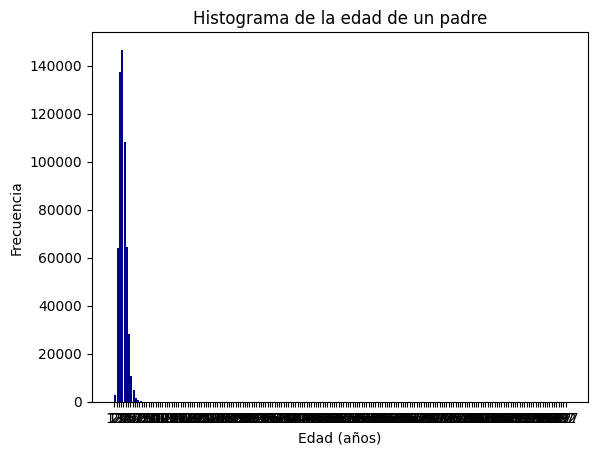

In [4]:
import matplotlib.pyplot as plot
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE)+1,5)
plot.hist(df.EDAD_PADRE, bins=intervalos,color="darkblue", rwidth=0.85)
plot.title("Histograma de la edad de un padre")
plot.xlabel("Edad (años)")
plot.ylabel("Frecuencia")
plot.xticks(intervalos)
plot.show()


In [5]:
df1 = df[(df.EDAD_PADRE < 120) & (df.EDAD_MADRE!= 99) & (df.N_HIJOSV!= 99)]
df1.head(5)


,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,2
76,21,3,1


<ipython-input-6-1eb8310e2948>:12: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label= 'Distribución norma', color = "darkblue")


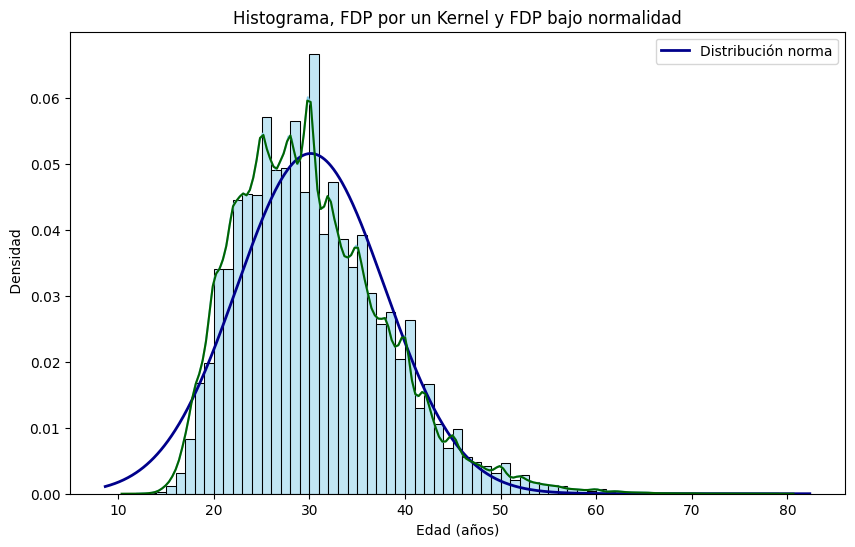

In [6]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE)+ 1)
plt.figure(figsize=(10,6))
sns.histplot(x = df1.EDAD_PADRE, bins=intervalos1, kde = True, stat = "density", color = "skyblue" , edgecolor ='black') #kde = True es la grafica de densidad de probabilidad estimada por un método Kernell

xmin, xmax, = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))
plt.plot(x, p, 'k', linewidth=2, label= 'Distribución norma', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel(' Densidad')
plt.legend ()

#Mostrar el gráfico
plt.show()


sea $X:=$ Edad del padre de un recíen nacido en Colombia.

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel ( línea cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea azul), $X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S^2_x)$, enotnces no asumimos normalidad.


In [7]:
from scipy.stats import shapiro
shapiro(df1.EDAD_PADRE)


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568276.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9627148118717348), pvalue=np.float64(1.919587188982723e-116))

*  Si el  **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hípotesis nula con una confianza del 95%.
*   Si el **valor p** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hípotesis nula con una confianza del 95%.
En nuestro caso particular, tenemos que pvalue=(1.919587188982723e-116) < 0.05, es decir, se rechaza que la variables aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal.


In [8]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)


568276

In [9]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])


ShapiroResult(statistic=np.float64(0.8712196760691034), pvalue=np.float64(7.853590048849878e-08))

Como el valor de p (igual a $1.4033432617481186 \times 10^{-9}$) es menor que 0.05, entonces se rechaza que la variable de la edad de un padre de un recién nacido en Colombia presenta distribución normal.

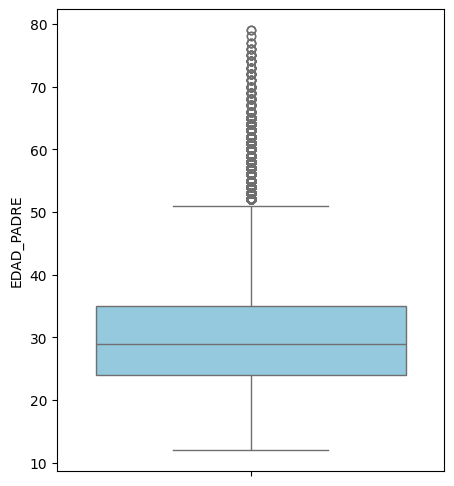

In [10]:
plt.figure(figsize=(5,6))
sns.boxplot(df1.EDAD_PADRE, color= 'skyblue', saturation=0.75)
plt.show()


se concidera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor que 50 años.El primer cuartil es aproximandamente en 25 años, la media aritmética es aproximandamente 29 años y el tercer cuartil es aproximadamente en 35 años.

$\text{Rango intercuartílico = Tercer cuartil - primer cuartil} = 35 - 25 =10$


In [11]:
import plotly.express as px
plt.figure(figsize=(5,5))
fig = px.strip(df1.EDAD_PADRE, orientation='h')
fig.show()


<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién nacido en Colombia.

In [12]:
import numpy as np
from scipy.stats import skew, kurtosis
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza: {np.var(df1.EDAD_PADRE)} y la desviación estandar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")


Media: 30.148239587805925
Varianza: 59.92624560757446 y la desviación estandar es de 7.741204402906208
Asimetría: 0.7932649439125867
Curtosis: 0.8974620245423521


*   Aporximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 30.1 años.
*   Aproximadamente la distancia entre lo valores de la edad de un padre de un recién nacido en Colombia y la media es de 7.74 años.

*   La distribución de la edad de un padre de un recién nacido en Colombia es asimetrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.
*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padres de un recién nacido en Colombia con respecto a la media.


**•	Diagrama de dispersión y la recta de regresión para datos bivariados.**
Una variable depende de la otra, cuando la ejecución de esta se ve afectada por la variable independiente. Ejemplo: El precio de una vivienda depende del número de habitaciones, ya que entre más habitaciones se tiene mayor precio.

 Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia. Ejemplo: Consumo de arroz y de carne, ya que se ha visto que al comerse más arroz se come más carne, pero no hay una dependencia entre estas dos variables


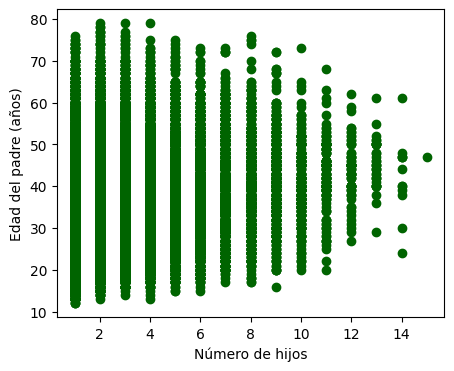

In [20]:
plt.figure(figsize = (5,4))
plt.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "darkgreen", marker = "o")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre (años)')
plt.show()


Se observa en el diagrama de dispersión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadas. Para nuestro ejemplo quiere decir que el número de hijos y la edad de un padre en Colombia no están correlacionadas (padre joven con muchos hijos o un padre mayor con pocos hijos)

In [21]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
#df1["N_HIJOSV"] es igual a escribir df1.N_HIJOSV
modelo.fit(np.array(df1.N_HIJOSV).reshape(-1,1), np.array(df1["EDAD_PADRE"]).reshape(-1,1))
predi_lineal = modelo.predict(np.array(df1.N_HIJOSV). reshape(-1,1))
predi_lineal


array([[30.29315726],
       [30.29315726],
       [34.62354964],
       ...,
       [30.29315726],
       [32.45835345],
       [30.29315726]])

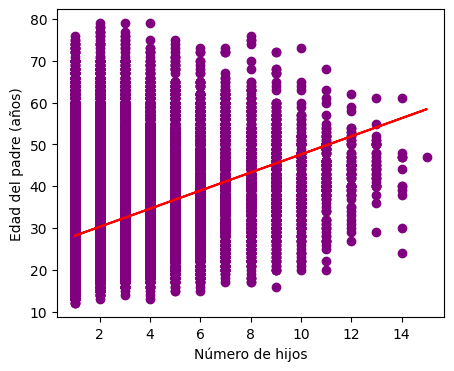

In [22]:
plt.figure(figsize=(5,4))
plt.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.plot(df1.N_HIJOSV,predi_lineal, linestyle='-', color = "red")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre (años)')
plt.show()


De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más hijos tiene un hombre en Colombia, más años tiene esta persona.

La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y.


In [27]:
import numpy as np
from scipy.stats import spearmanr
from scipy.stats import kendalltau
coef_pearson = np.corrcoef(df1["N_HIJOSV"],df1["EDAD_PADRE"])
coef_spearman, _  =spearmanr(df1["N_HIJOSV"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_HIJOSV"], df1["EDAD_PADRE"])
print(f"Loa coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}")


Loa coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente [[1.         0.33084299]
 [0.33084299 1.        ]], 0.3563003702777745 y 0.28081560831586566


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:
Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174.[link](https://www.jstor.org/stable/2529310)

*   X y Y son independientes o no estan correlacionadas : $\rho (X,Y)  \approx 0,  \eta (X,Y) \approx 0, \kappa (X,Y) \approx 0$.


*  Y depende insignificantemente de X o X y Y estan insignificantemente correlacionadas si $ 0 < \vert \rho (X,Y) \vert < 0.2$, $ 0 < \vert \eta (X,Y) \vert < 0.2$, $ 0 < \vert \kappa (X,Y) \vert < 0.2$.

*   Y depende discretamente de X o X y Y estan discretamente correlacionadas si $ 0.2 < \vert \rho (X,Y) \vert < 0.4$, $ 0.2 < \vert \eta (X,Y) \vert < 0.4$, $ 0.2 < \vert \kappa (X,Y) \vert < 0.4$.
*   Y depende moderadamente de X o X y Y estan moderadamente correlacionadas si $ 0.4 < \vert \rho (X,Y) \vert < 0.6$, $ 0.4 < \vert \eta (X,Y) \vert < 0.6$, $ 0.4 < \vert \kappa (X,Y) \vert < 0.6$.

*  Y depende sustancialmente de X o X y Y estan sustancialmente correlacionadas si $ 0.6 < \vert \rho (X,Y) \vert < 0.8$, $ 0.6 < \vert \eta (X,Y) \vert < 0.8$, $ 0.6 < \vert \kappa (X,Y) \vert < 0.8$.

*   Y depende fuertemente de X o X y Y estan fuertemente correlacionadas si $ 0.8 < \vert \rho (X,Y) \vert < 1$, $ 0.8 < \vert \eta (X,Y) \vert < 1$, $ 0.8 < \vert \kappa (X,Y) \vert < 1$.
